In [2]:
import trimesh
from trimesh import registration
import numpy as np

# Data loading

In [3]:
# model_path = 'models/low_poly_plane.glb'
model_path = 'models/cybertruck.obj'

In [4]:
scene = trimesh.load(model_path)
geometries = list(scene.geometry.values())

# geometry = geometries[0]
# adjacency_matrix = geometry.edges_sparse

# Lab 1
## Default view

In [5]:
cybertruck = trimesh.util.concatenate(geometries)
cybertruck.visual = cybertruck.visual.to_color()
cybertruck.show()

### Filter out textures

In [60]:
out = trimesh.exchange.obj.export_obj(
    cybertruck,
    include_normals=True,
    include_color=True,
    include_texture=True,
    return_texture=False,
    write_texture=True
)

In [61]:
with open('models/filtered_cybertruck.obj', 'w') as file:
    file.write(out)

In [62]:
scene = trimesh.load('models/filtered_cybertruck.obj')
scene.show()

## Voxelized view

In [6]:
cybertruck.voxelized(0.05).show()

## Point cloud view

In [7]:
# points = combined.bounding_box_oriented.sample_volume(count=10000)
points = trimesh.sample.sample_surface(cybertruck, 30000)[0]

point_cloud = trimesh.points.PointCloud(points, colors=np.tile(np.array([0, 0, 0, 1]), (len(points), 1)))

trimesh.Scene(point_cloud).show()

## Trimesh ICP

In [6]:
angle = np.math.pi / 4
direction = [1, 1, 0]
center = [0, 0, 0]
rot_matrix = trimesh.transformations.rotation_matrix(angle, direction, center)

rotated_cybertruck = cybertruck.copy()
rotated_cybertruck.apply_transform(rot_matrix)

<trimesh.Trimesh(vertices.shape=(12153, 3), faces.shape=(9153, 3))>

In [7]:
rotated_cybertruck.visual.vertex_colors = [0.1, 0.9, 0.9, 1.0]
rotated_cybertruck.show()

In [8]:
scene = trimesh.Scene([cybertruck, rotated_cybertruck])
scene.show()

## Principal axes of inertia

In [10]:
transform, cost = registration.mesh_other(cybertruck, rotated_cybertruck, samples=2000, scale=True)
print('Cost error:', cost)
print(transform)

Cost error: 1.9317161904023917e-09
[[-8.54499960e-01  1.40919956e-01  4.99992981e-01  2.71787278e-03]
 [-1.51837186e-01  8.52724203e-01 -4.99828470e-01  7.59184918e-04]
 [ 4.96786558e-01  5.03015504e-01  7.07248271e-01 -1.42170725e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [11]:
new_scene = scene.copy()
new_scene.geometry["geometry_0"].apply_transform(transform)
new_scene.show()

## Transform a cube into a cybertruck!

In [1]:
import os
import torch
from pytorch3d.io import load_obj, save_obj
from pytorch3d.structures import Meshes
from pytorch3d.utils import ico_sphere
from pytorch3d.ops import sample_points_from_meshes
from pytorch3d.loss import (
    chamfer_distance, 
    mesh_edge_loss, 
    mesh_laplacian_smoothing, 
    mesh_normal_consistency,
)
import numpy as np
from tqdm.notebook import tqdm
# %matplotlib notebook 
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 80
mpl.rcParams['figure.dpi'] = 80

# Set the device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")
    print("WARNING: CPU only, this will be slow!")

In [78]:
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras,
    DirectionalLights, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    HardPhongShader
)
from pytorch3d.renderer import (
    FoVPerspectiveCameras, look_at_view_transform, look_at_rotation, 
    RasterizationSettings, MeshRenderer, MeshRasterizer, BlendParams,
    SoftSilhouetteShader, HardPhongShader, PointLights, TexturesVertex,
)


In [30]:
from celluloid import Camera

In [65]:
trg_obj = os.path.join('models/filtered_cybertruck.obj')

In [213]:
# Load the obj and ignore the textures and materials.
verts, faces_idx, _ = load_obj('models/filtered_cybertruck.obj')
faces = faces_idx.verts_idx
verts = verts.to(device)

# Initialize each vertex to be white in color.
verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)
textures = TexturesVertex(verts_features=verts_rgb.to(device))

#new
center = verts.mean(0)
verts = verts - center
scale = max(verts.abs().max(0)[0])
verts = verts / scale

# Create a Meshes object for the teapot. Here we have only one mesh in the batch.
trg_mesh = Meshes(
    verts=[verts.to(device)],   
    faces=[faces.to(device)], 
    textures=textures
)

/opt/conda/lib/python3.9/site-packages/pytorch3d/io/obj_io.py:542: UserWarning: No mtl file provided
  warnings.warn("No mtl file provided")


In [214]:
# We initialize the source shape to be a sphere of radius 1
sphere = ico_sphere(4, device)

verts, faces = sphere.get_mesh_verts_faces(0)

verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)
textures = TexturesVertex(verts_features=verts_rgb.to(device))
src_mesh = Meshes(
    verts=[verts.to(device)],   
    faces=[faces.to(device)], 
    textures=textures
)

In [ ]:
### FASTER RENDERER
### USE AT YOUR OWN RISK

# Initialize a perspective camera.
cameras = FoVPerspectiveCameras(device=device)

# To blend the 100 faces we set a few parameters which control the opacity and the sharpness of 
# edges. Refer to blending.py for more details. 
blend_params = BlendParams(sigma=1e-4, gamma=1e-4)

# Define the settings for rasterization and shading. Here we set the output image to be of size
# 256x256. To form the blended image we use 100 faces for each pixel. We also set bin_size and max_faces_per_bin to None which ensure that 
# the faster coarse-to-fine rasterization method is used. Refer to rasterize_meshes.py for 
# explanations of these parameters. Refer to docs/notes/renderer.md for an explanation of 
# the difference between naive and coarse-to-fine rasterization. 
raster_settings = RasterizationSettings(
    image_size=256, 
    blur_radius=np.log(1. / 1e-4 - 1.) * blend_params.sigma, 
    faces_per_pixel=100, 
)

# Create a silhouette mesh renderer by composing a rasterizer and a shader. 
silhouette_renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=SoftSilhouetteShader(blend_params=blend_params)
)


# We will also create a Phong renderer. This is simpler and only needs to render one face per pixel.
raster_settings = RasterizationSettings(
    image_size=256, 
    blur_radius=0.0, 
    faces_per_pixel=1, 
)
# We can add a point light in front of the object. 
lights = PointLights(device=device, location=((2.0, 2.0, -2.0),))
phong_renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(device=device, cameras=cameras, lights=lights)
)

In [203]:
# Initialize an OpenGL perspective camera.
cameras = OpenGLPerspectiveCameras(device=device)

# We will also create a phong renderer. This is simpler and only needs to render one face per pixel.
raster_settings = RasterizationSettings(
    image_size=1024, 
    blur_radius=0, 
    faces_per_pixel=1, 
)

# We can add a directional light in the scene. 
ambient_color = torch.FloatTensor([[0.0, 0.0, 0.0]]).to(device)
diffuse_color = torch.FloatTensor([[1.0, 1.0, 1.0]]).to(device)
specular_color = torch.FloatTensor([[0.1, 0.1, 0.1]]).to(device)
direction = torch.FloatTensor([[1, 1, 1]]).to(device)
lights = DirectionalLights(ambient_color=ambient_color,
                           diffuse_color=diffuse_color,
                           specular_color=specular_color,
                           direction=direction,
                           device=device)

phong_renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(
        device=device, 
        cameras=cameras, 
        lights=lights
        )
)

# Select the viewpoint using spherical angles  
distance = 2.5   # distance from camera to the object`
elevation = 15.0   # angle of elevation in degrees
azimuth = 35.0  # No rotation so the camera is positioned on the +Z axis. 

# Get the position of the camera based on the spherical angles
R, T = look_at_view_transform(distance, elevation, azimuth, device=device,at=((0.0,0.1,0.0),))


In [205]:
# Render the bunny providing the values of R and T. 
image_cybertruck = phong_renderer(meshes_world=trg_mesh, R=R, T=T)
image_sphere = phong_renderer(meshes_world=src_mesh, R=R, T=T)

image_sphere = image_sphere.cpu().numpy()
image_cybertruck = image_cybertruck.cpu().numpy()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


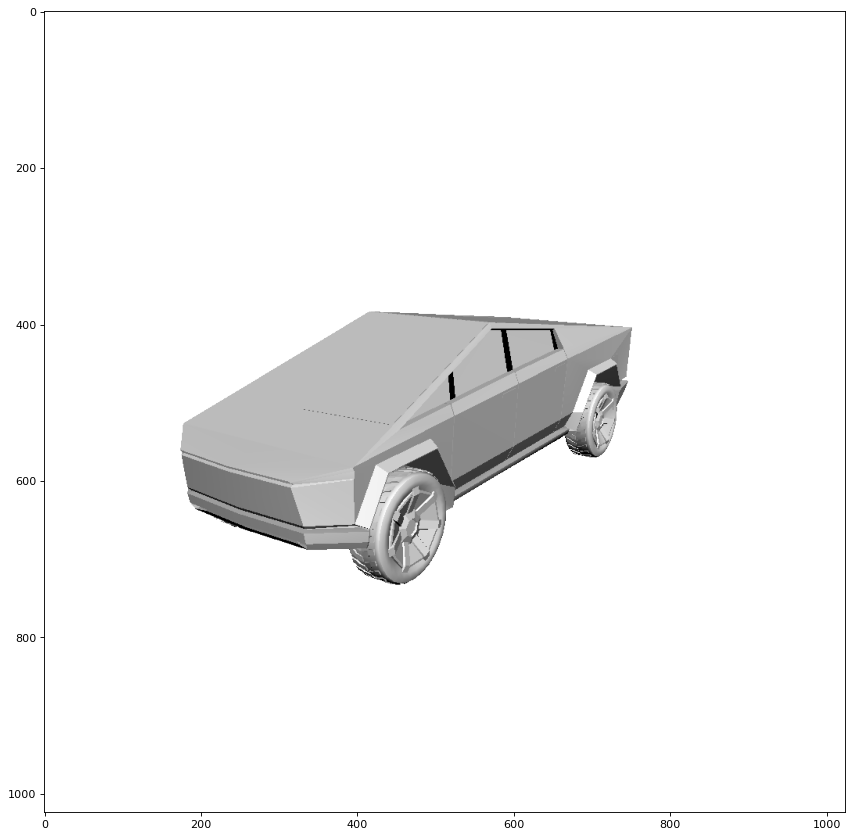

In [206]:
# Target mesh of cybertruck
plt.figure(figsize=(13, 13))
plt.imshow(image_cybertruck.squeeze())
plt.grid(False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


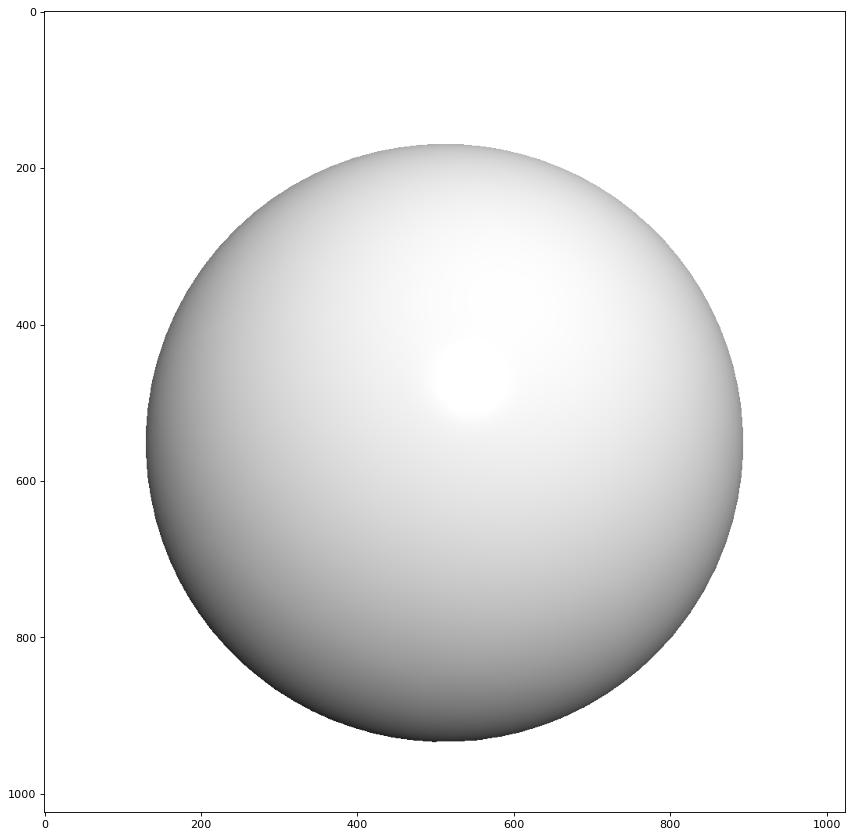

In [207]:
# Source mesh of sphere
plt.figure(figsize=(13, 13))
plt.imshow(image_sphere.squeeze())
plt.grid(False)

  0%|          | 0/2000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

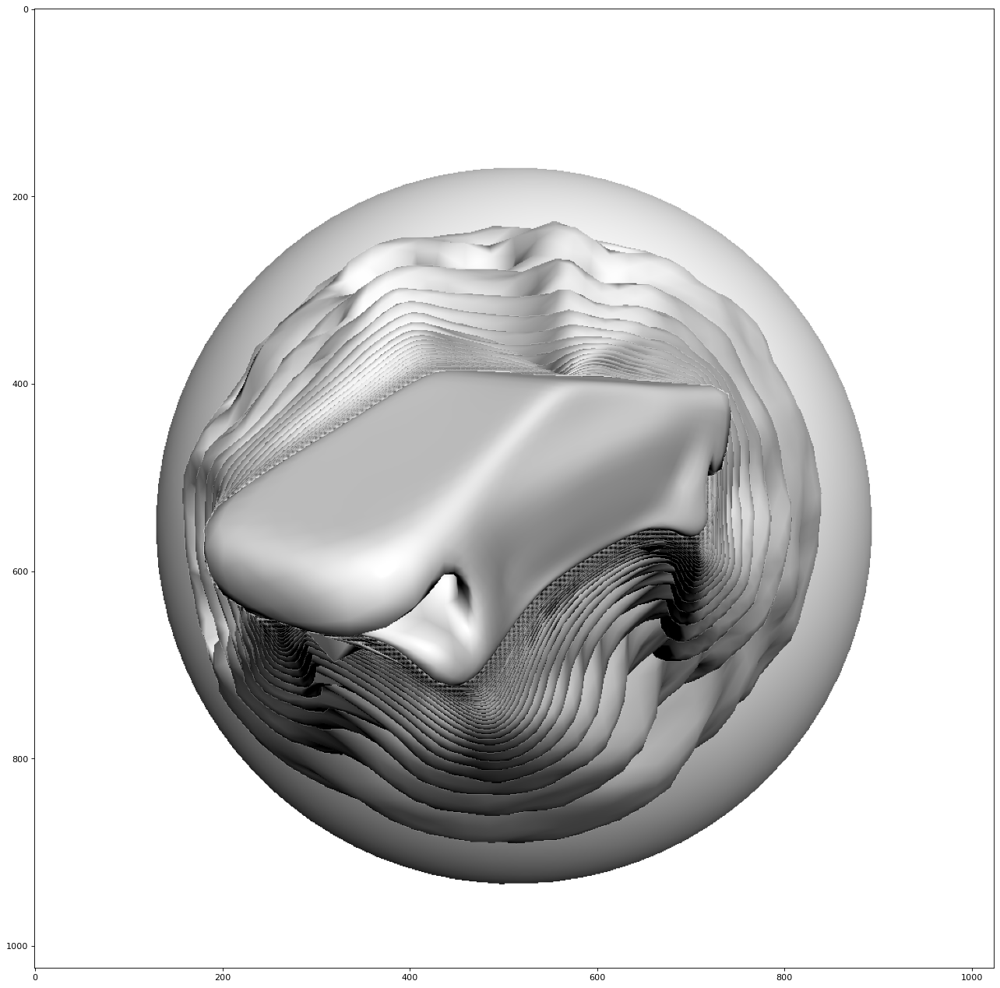

In [215]:
# We will learn to deform the source mesh by offsetting its vertices
# The shape of the deform parameters is equal to the total number of vertices in src_mesh
deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)
# The optimizer
optimizer = torch.optim.SGD([deform_verts], lr=1.0, momentum=0.9)

%matplotlib widget
# Number of optimization steps
Niter = 2000
# Weight for the chamfer loss
w_chamfer = 1.0 
# Weight for mesh edge loss
w_edge = 1.0 
# Weight for mesh normal consistency
w_normal = 0.01 
# Weight for mesh laplacian smoothing
w_laplacian = 0.1 
# Plot period for the losses
plot_period = 50
loop = tqdm(range(Niter))

chamfer_losses = []
laplacian_losses = []
edge_losses = []
normal_losses = []

%matplotlib inline
fig = plt.figure(figsize=(20, 20))
camera = Camera(fig)


for i in loop:
    # Initialize optimizer
    optimizer.zero_grad()
    
    # Deform the mesh
    new_src_mesh = src_mesh.offset_verts(deform_verts)
    
    # We sample 5k points from the surface of each mesh 
    sample_trg = sample_points_from_meshes(trg_mesh, 5000)
    sample_src = sample_points_from_meshes(new_src_mesh, 5000)
    
    # We compare the two sets of pointclouds by computing (a) the chamfer loss
    loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)
    
    # and (b) the edge length of the predicted mesh
    loss_edge = mesh_edge_loss(new_src_mesh)
    
    # mesh normal consistency
    loss_normal = mesh_normal_consistency(new_src_mesh)
    
    # mesh laplacian smoothing
    loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")
    
    # Weighted sum of the losses
    loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian
    
    # Print the losses
    loop.set_description('total_loss = %.6f' % loss)
    
    # Save the losses for plotting
    chamfer_losses.append(float(loss_chamfer.detach().cpu()))
    edge_losses.append(float(loss_edge.detach().cpu()))
    normal_losses.append(float(loss_normal.detach().cpu()))
    laplacian_losses.append(float(loss_laplacian.detach().cpu()))
    
    # Plot mesh
    if i % plot_period == 0 or i==0:
        image_cybertruck = phong_renderer(meshes_world=new_src_mesh, R=R, T=T)
        image_cybertruck = image_cybertruck.detach().cpu().numpy()
        
        plt.imshow(image_cybertruck.squeeze())
        plt.grid(False)
        camera.snap()
        
    # Optimization step
    loss.backward()
    optimizer.step()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


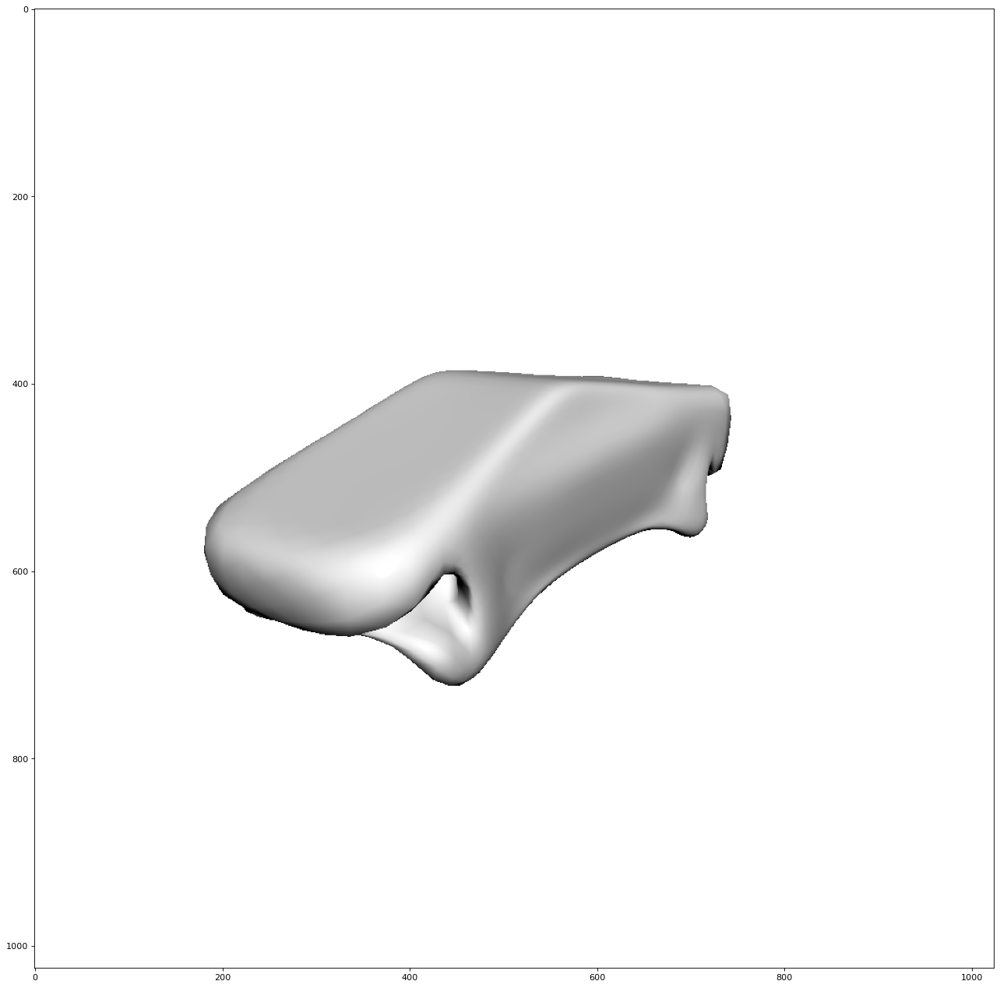

In [216]:
# Final image of sphere
plt.figure(figsize=(20, 20))
plt.imshow(image_cybertruck.squeeze())
plt.grid(False)

In [217]:
animation = camera.animate()
animation.save('deformation_animation_final_scaled.gif')

MovieWriter ffmpeg unavailable; using Pillow instead.


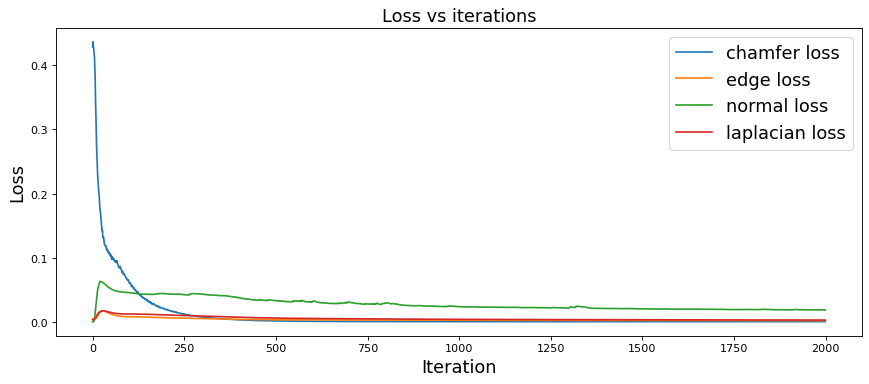

In [218]:
fig = plt.figure(figsize=(13, 5))
ax = fig.gca()
ax.plot(chamfer_losses, label="chamfer loss")
ax.plot(edge_losses, label="edge loss")
ax.plot(normal_losses, label="normal loss")
ax.plot(laplacian_losses, label="laplacian loss")
ax.legend(fontsize="16")
ax.set_xlabel("Iteration", fontsize="16")
ax.set_ylabel("Loss", fontsize="16")
ax.set_title("Loss vs iterations", fontsize="16");


In [212]:


# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

# Scale normalize back to the original target size
final_verts = final_verts * scale + center

# Store the predicted mesh using save_obj
final_obj = os.path.join('./', 'final_model_final.obj')
save_obj(final_obj, final_verts, final_faces)



     
